In any single cell RNA sequencing pipeline, the most critical assumption underlying the analysis of such data is the unique and one-to-one association between transcripts and cells. It is however known that a fraction of the transcripts in any scRNA-seq assay is erroneously associated with the "wrong" single cell. This is believed to occur primarily when RNA is freely diffusing in the cell suspension, such that capturing small solution volumes with a potential single cell within them must also entail the capture and later processing of an additional amount of RNA without a clear cellular identity.

Since the freely diffusing RNA in solution must originate from punctured or apoptotic cells in the current tissue sample, the result is a contamination of each single cell RNA-seq profile with an additional sample from an "ambient noise" distribution. Such ambient noise can be highly batch-specific, depending on the quality and composition of the single-cell suspension preparation.  

Our current model is based on metacells and fit metacells RNA distributions as mixtures of signal and noise, thereby leveraging the quantitative precision of metacells to infer batch-specific noise levels.

In this vignette we will show and explain how to perform ambient noise estimation and cleaning process using the MCNoise pipeline.

This vignette assume we already have an existing metacell model, after doublets and outliers removal. For explanation about the metacell library and pipeline, please refer to https://github.com/tanaylab/metacells-vignettes

For the purpose of the vignette we took a case study of BM dataset generated by Hourigan et al

The vignette has five steps:

1. Setup of functions and datasets
2. Basic noise estimation based on the metacell model
3. More in depth estimation which handle two issues:
   - The effect of ambient noise over the metacell model, and as such, effecting the naive estimation we provided. To over overcome this, we perform another noise estimation which is aware of the noise estimation from the first tep.
   - (Optional) step of removal of artifacts, weak dobulets and other cells which clearly don't match the noise model and can effect the noise estimation.
4. Running QC over the final estimation 
5. Generating a clean metacell model for further analysis

# Setup

We are going to start by importing the python libraries and modules we will be using. This might take up to a minute due to the python and C++ extensions which are part of the metacell library

In [1]:
import sys 
import pickle
import os

import numpy as np
import pandas as pd 
import anndata as ad

import seaborn as sb
import matplotlib.pyplot as plt
import scanpy as sc
import metacells as mc
import tqdm
import scipy

sys.path.append("../code_v3")
from AmbientNoiseFinder import  AmbientNoiseFinder
from AmbientNoiseEstimator import AmbientNoiseEstimator
import denoise_metacells_utils, utilities
import ambient_logger


%load_ext autoreload
%autoreload 2

During startup - Warning messages:
1: Setting LC_CTYPE failed, using "C" 
2: Setting LC_COLLATE failed, using "C" 
3: Setting LC_TIME failed, using "C" 
4: Setting LC_MESSAGES failed, using "C" 
5: Setting LC_MONETARY failed, using "C" 
6: Setting LC_PAPER failed, using "C" 
7: Setting LC_MEASUREMENT failed, using "C" 


We will then define the different pathes we are going to use throught the pipeline and some general functions related to them

In [2]:
# The path for the cellranger directory will be used to extract the empty droplets information
cell_ranger_directory = "/home/drorba/raid/ambient/data/bm/cellranger_output"

# Will contain data structures from the MCNoise pipeline, includes the empty droplets information, estimation results, and others
output_path = "/net/mraid14/export/tgdata/users/drorba/ambient/out/bm/mc_v09_multi/"

# Noisy cells and metacells path
mat_path = "/home/drorba/raid/ambient/data/bm_new_version/original_new_version/noisy_cells.h5ad"
metacells_path = "/home/drorba/raid/ambient/data/bm_new_version/original_new_version/noisy_metacells.h5ad"

# List of all the batches to use when estimating the ambient noise levels
batches = ["A","B","C1","Ck","C2","E","F","G","H","J","K","L","M","N","O","P","Q","R","T","U","W", 
           "S1","S2","Sk1","Sk2"]


batches_to_mtx_paths = {
    batch: os.path.join(cell_ranger_directory, batch, "outs/raw_feature_bc_matrix.h5") for batch in batches
}

We can now load the cells and metacells anndata files and make sure the umap params were defined for plotting

In [3]:
mat_ad = ad.read_h5ad(mat_path)
metacells_ad = ad.read_h5ad(metacells_path)
mc.pl.compute_umap_by_markers(metacells_ad, min_dist=3.0, random_seed=169)

set metacells.obsp[obs_balanced_ranks]: 15152 nonzero (1.021%) out of 1483524 elements
set metacells.obsp[obs_pruned_ranks]: 4857 nonzero (0.3274%) out of 1483524 elements
set metacells.obsp[obs_outgoing_weights]: 4857 nonzero (0.3274%) out of 1483524 elements
set metacells.obsp[umap_distances]: csr_matrix 1218 X 1218 float32s (1482306 > 0, 99.92%)
set metacells.obs[x]: 1218 float32s
set metacells.obs[y]: 1218 float32s


We will also extract the empty droplets information from the raw matrices.
This process need to be run only once, and it might takes a couple of seconds, so we will save the results in a pickle which can be imported later

In [4]:
batch_empty_droplets = utilities.get_empty_droplets_total_genes_count(batches_to_mtx_paths, 
                                                                      sc.read_10x_h5, 
                                                                      number_of_processes=1, 
                                                                      max_umi_count_to_be_empty_droplet=10)

with open(os.path.join(output_path,"batch_empty_droplets_dict.pkl"), "wb") as f: 
    pickle.dump(batch_empty_droplets,f)


with open(os.path.join(output_path,"batch_empty_droplets_dict.pkl"), "rb") as f:
    batch_empty_droplets = pickle.load(f)

INFO - A had 236568(55%) out of 426783 empty droplets
INFO - B had 154962(51%) out of 306601 empty droplets
INFO - C1 had 207162(59%) out of 352172 empty droplets
INFO - Ck had 114026(54%) out of 211443 empty droplets
INFO - C2 had 256676(67%) out of 382914 empty droplets
INFO - E had 180511(57%) out of 316375 empty droplets
INFO - F had 156646(50%) out of 316428 empty droplets
INFO - G had 252785(61%) out of 417706 empty droplets
INFO - H had 170194(50%) out of 338036 empty droplets
INFO - J had 188041(48%) out of 390183 empty droplets
INFO - K had 196158(51%) out of 382432 empty droplets
INFO - L had 191107(54%) out of 351644 empty droplets
INFO - M had 202724(55%) out of 370471 empty droplets
INFO - N had 179516(54%) out of 332029 empty droplets
INFO - O had 172561(51%) out of 335431 empty droplets
INFO - P had 266808(58%) out of 460764 empty droplets
INFO - Q had 180743(67%) out of 268448 empty droplets
INFO - R had 168807(50%) out of 338423 empty droplets
INFO - T had 198178(54%) 

We then make sure that the cells, metacells and empty droplets share exactly the same gene set, this should always be true but it's still good to validate

In [5]:
mat_ad, metacells_ad,batch_empty_droplets = utilities.remove_uncommon_genes_from_cells_metacells_empty_droplets_files(mat_ad, metacells_ad,batch_empty_droplets)

# Noise estimation - step 1

## Estimating noise levels

The first step of the pipeline is to get estimation for the noise levels of the different batches, to get this we will use the noisy cells and metacells matrix, and also the empty droplets distribution of the different batches.

We will cluster significantly variables genes (given or auto-generated list) and cluster the metacells based on those genes into several groups. 
We will then aggregate the cells from each group - called Pgm (metacell cluster + gene cluster couple) and create an equation for this combination, representing the observed UMIs as a function of the noise + native expression.

The MCNoise pipeline will need a way to extract the batch name for each cell, we will define a helper function which get the cells anndata and return a series of the batch for each cell.
In some cases this function might be different, but it should be pretty easy to write one which is appropriate for your own data

In [6]:
def extract_batch_names_function(mat_ad):
    return mat_ad.obs.batch.values

Here we initalize the main class which find traces of noise in the data:

- By changing the paramaters, the user can define the threshold for significat variable genes (default is 5 fold), or provide a given set of genes\ metacelsl clusters for noise detection.

- The estimation can be done over all the cells, providing a mean for all umis depth, or split into different bins for more precise estimation. By default, we use 3 bins, but this can change using `umi_depth_number_of_bins` param and might be a good step to start with 1 bin for first iteration.

The class provide several usefull plots, which include plotting the umap with the metacell clustering, the epxression fold between different Pgm, and the distribution of cell clusters over the set of different batches, and genes metacells clusters over relative gene expression. This expression fold between different Pgm should be used to find the appropriate threshold for equation generation

In [7]:
# Specificlly in this data, we know that 8 genes cluster makes better seperation for gene modules compare to 
# the default 10, so we will change the `number_of_genes_clusters` param.

anf = AmbientNoiseFinder(cells_adata=mat_ad, 
                         metacells_adata=metacells_ad,
                         batches_empty_droplets_dict=batch_empty_droplets,
                         extract_batch_names_function=extract_batch_names_function, 
                         expression_delta_for_candidates_genes=5, 
                         number_of_genes_clusters=8, 
                        )

/home/ofirr/anaconda3/envs/amosbase/lib/python3.9/site-packages/metacells/utilities/annotation.py:1027: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[name] = data
INFO - Working on 25 batches
INFO - No gene clusters provided, will create 8 clusters, only_use_features_genes: False, use_lateral_genes:False
INFO - No metacell clusters provided, will create 10 clusters
INFO - Ready to estimate noise levels


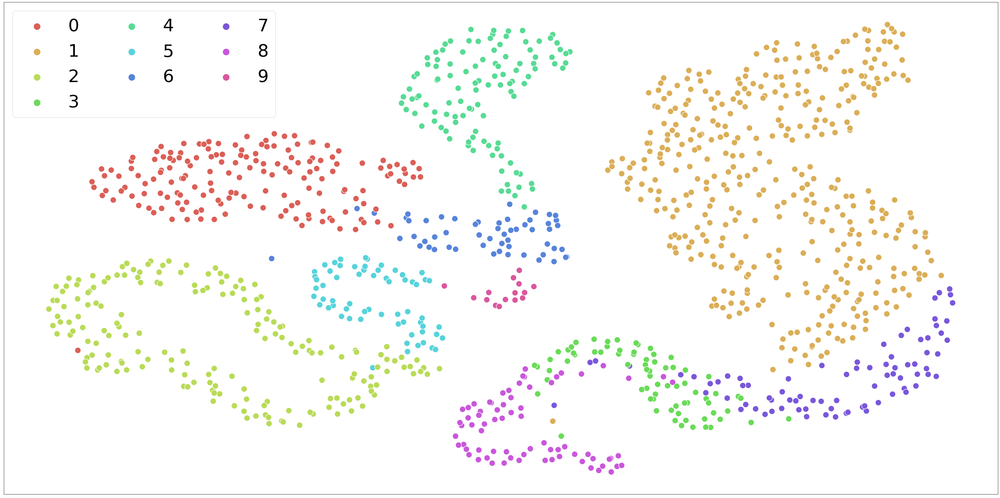

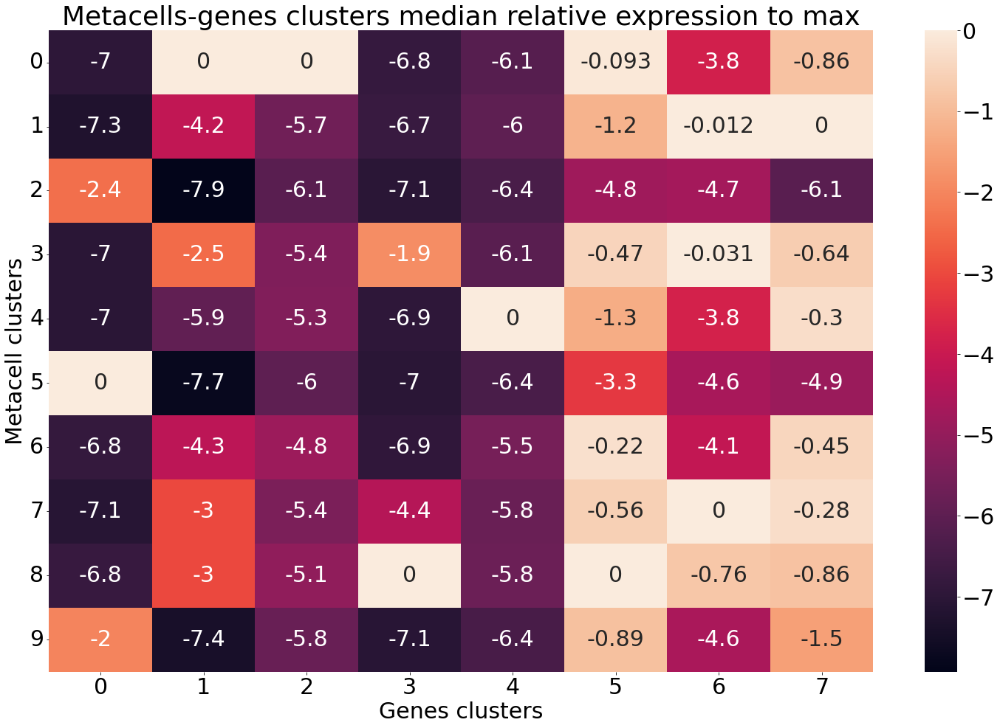

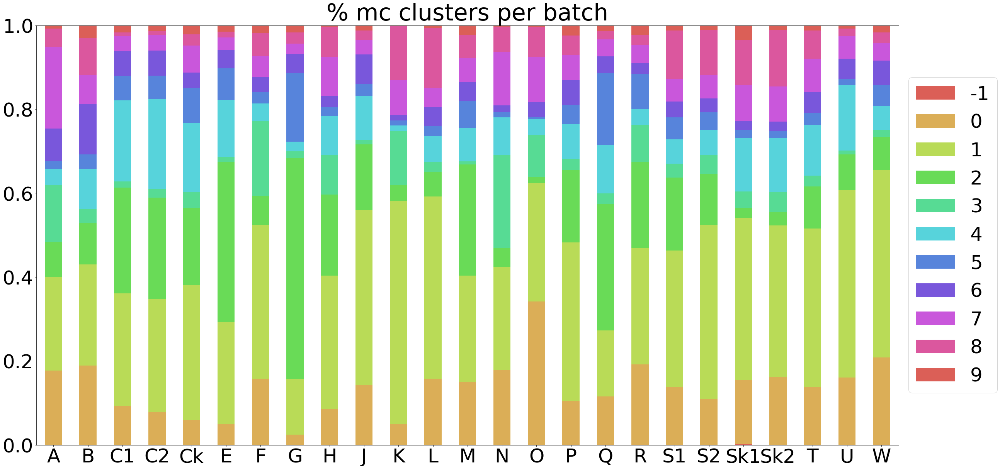

In [8]:
anf.plot_metacells_clustering_on_umap()
anf.plot_expression_diff_between_clusters(show_expression_value=True)
anf.plot_metacells_clusters_distribution_across_batches()
anf.plot_genes_mc_clusters()

Here, looking at the Pgm fold expression we can see the a reasonable cut-off is around `-4` relative fold expression
We will initalize `AmbientNoiseEstimator` object which will take this value, and will generate a set of equations for all appropriate Pgm.

We want to make sure the estimation uses enough data points for each estimation, meaning number of Pgm and number of batches. The default value is 3 for each, but this can be changed by the user.

We will then run `estimate_noise_levels` to generate the equations and solve them. We will only take equations from Pgm's which are more likely to represent noise than actual big native expression.

In [9]:
ane = AmbientNoiseEstimator(anf)
estimations_results = ane.estimate_noise_levels(max_relative_expression_for_metacells_genes_to_use = -4)

INFO - Starting to estimate noise levels per step
  0%|          | 0/10 [00:00<?, ?it/s]INFO - Step: 0, umi depth bin: 0 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step: 0, umi depth bin: 1 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step: 0, umi depth bin: 2 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step 0 didn't have enough equations to estimate noise, going to move to next step
INFO - Finish collecting information, solving equations for step 1
/net/mraid14/export/tgdata/users/drorba/ambient/new_analysis/../code_v3/RGlmSolver.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

By plotting the number of batches and Pgm used in each step, and the estimations of the different paramaters we can find in which step we get to a stable result, in our case it seems around step 5.

Having smaller threshold mean we use less data point for estimation, but that those points are in higher certinty related to noise, compare to this, using bigger threshold should decrease variablity but will be effected more from non-noisy parts

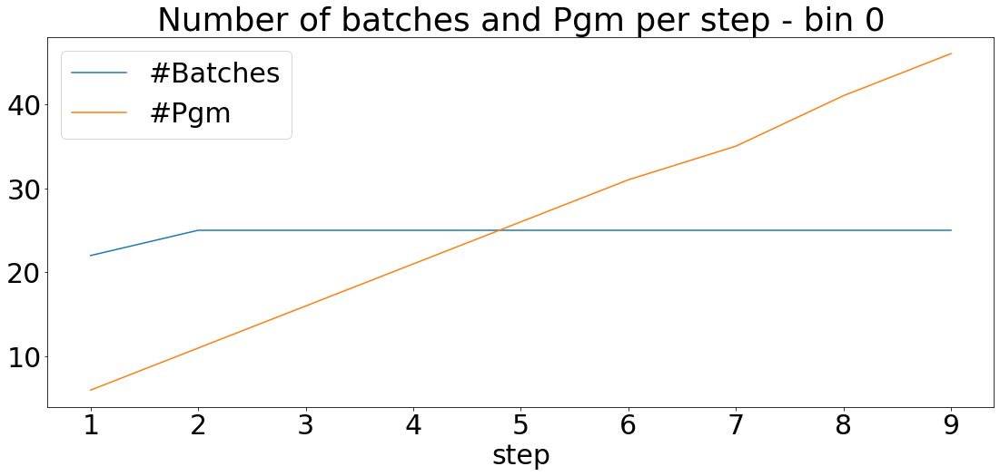

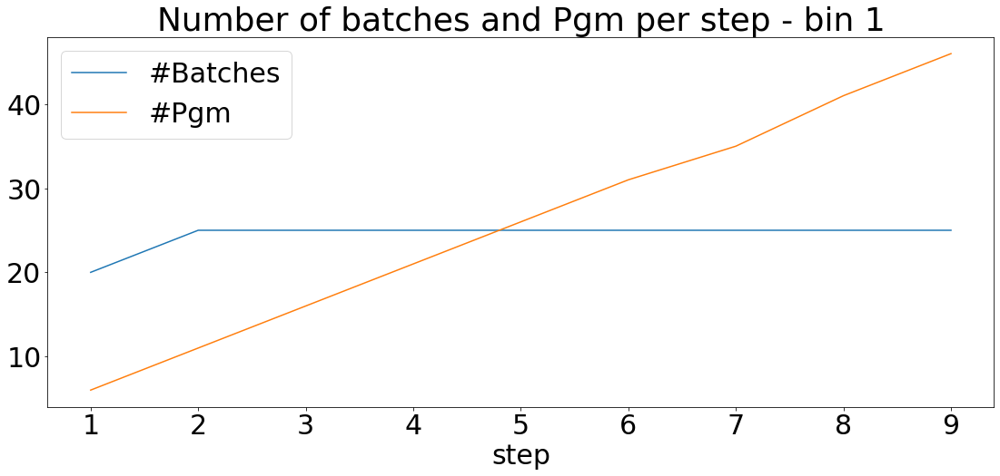

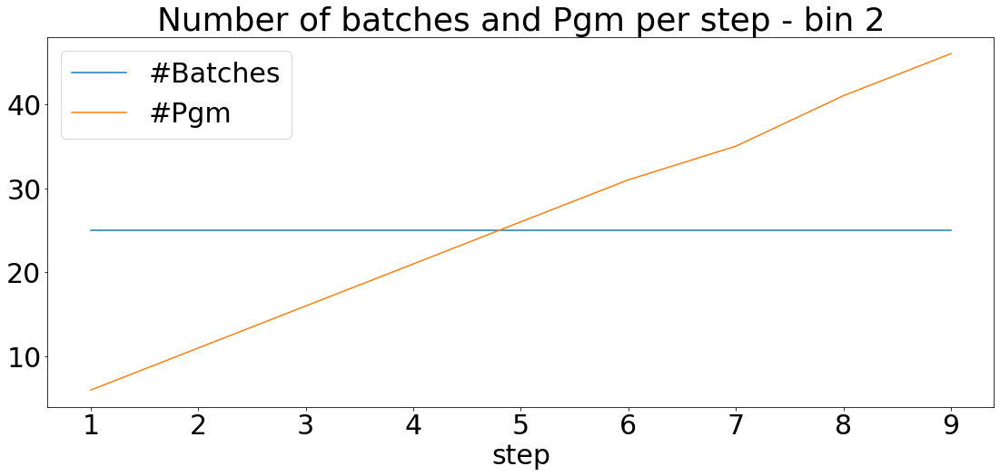

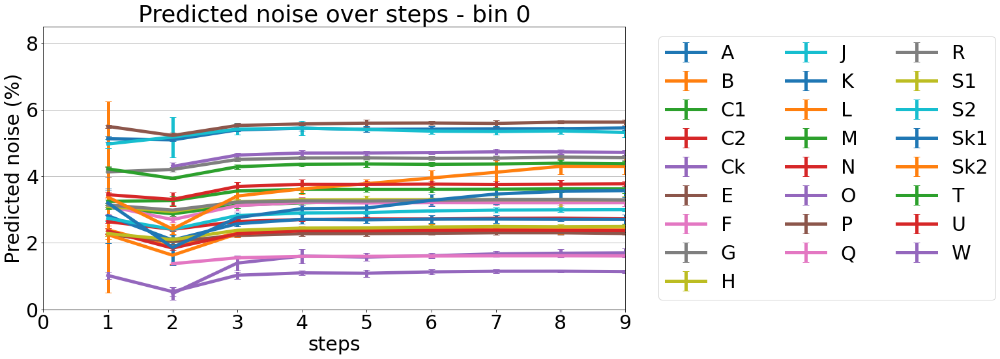

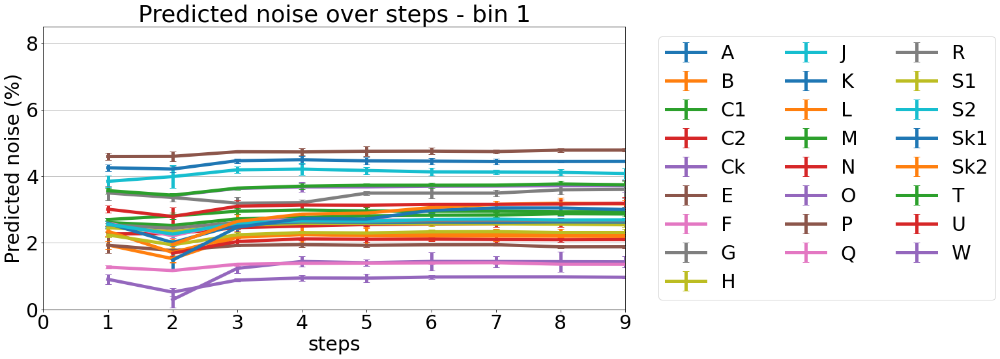

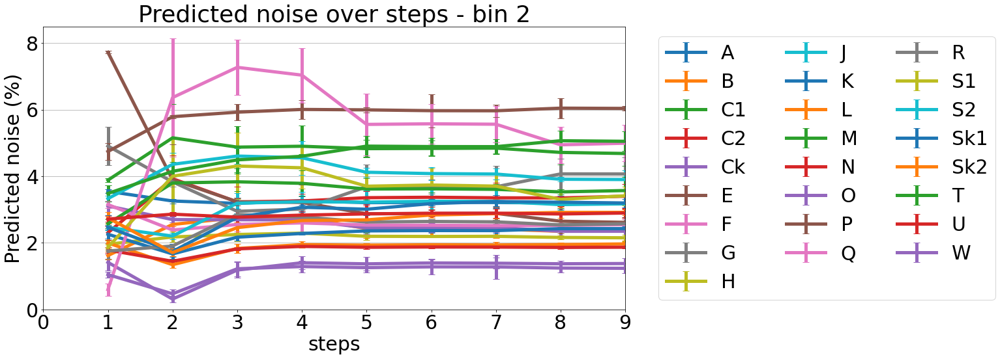

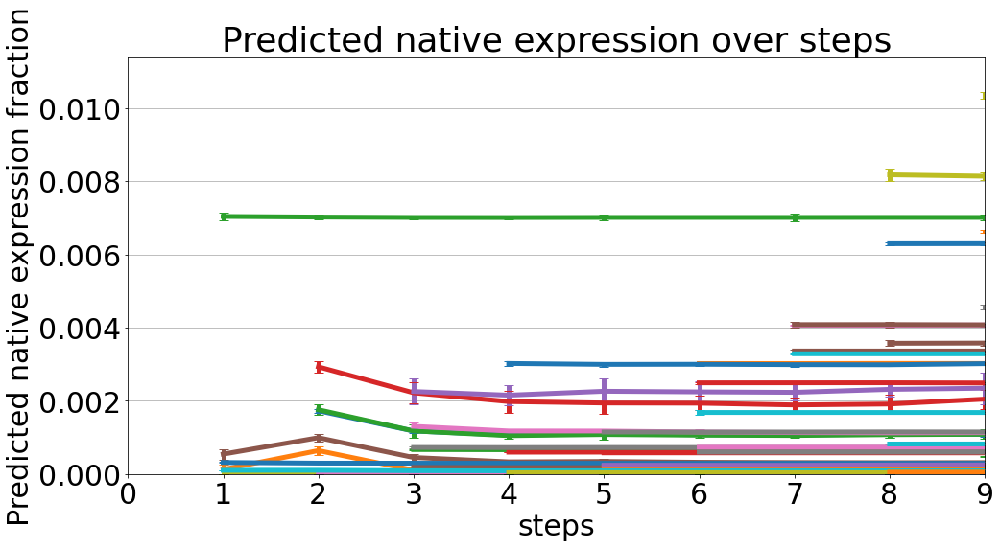

In [10]:
estimations_results.plot_number_of_batches_and_pgm_per_step()
estimations_results.plot_noise_level_estimation_per_step(show_batch_name=True)
estimations_results.plot_native_expression_estimation_per_step()

In [11]:
step_to_use = 5

At this point we alerady have a nice estimation for the noise levels in each batch, which we print. 
We will add this information into the cells by calling the `get_cells_adata_with_noise_level_estimations` function.

In [14]:
cells_with_noise_estimations_v1 = ane.get_cells_adata_with_noise_level_estimations(estimations_results, step_to_use)
cells_with_noise_estimations_v1.write_h5ad(os.path.join(output_path, "cells_with_noise_estimations_v1.h5ad"))

## Denoise metacells

At this point we can generate clean version of metacells by providing the cells anndata with the batch noise levels and the empty droplets information. To understand more about the cleaning process, please look at the code or paper

In [15]:
denoised_cells_v1 = denoise_metacells_utils.generate_denoised_metacells(cells_with_noise_estimations_v1, 
                                                                           batch_empty_droplets)

INFO - Starting to deniose entire cell matrix
INFO - Starts to denoise batch: S1
INFO - Starts to denoise batch: J
INFO - Starts to denoise batch: T
INFO - Starts to denoise batch: G
INFO - Starts to denoise batch: M
INFO - Starts to denoise batch: Sk1
INFO - Starts to denoise batch: C1
INFO - Starts to denoise batch: S2
INFO - Starts to denoise batch: W
INFO - Starts to denoise batch: N
INFO - Starts to denoise batch: P
INFO - Starts to denoise batch: C2
INFO - Starts to denoise batch: Sk2
INFO - Starts to denoise batch: R
INFO - Starts to denoise batch: L
INFO - Starts to denoise batch: F
INFO - Starts to denoise batch: K
INFO - Starts to denoise batch: A
INFO - Starts to denoise batch: U
INFO - Starts to denoise batch: E
INFO - Finish denoising batch: Sk1
INFO - Finish denoising batch: R
INFO - Starts to denoise batch: O
INFO - Starts to denoise batch: Q
INFO - Finish denoising batch: G
INFO - Starts to denoise batch: Ck
INFO - Finish denoising batch: S1
INFO - Starts to denoise bat

In [16]:
mc.pl.divide_and_conquer_pipeline(
    denoised_cells_v1,
    random_seed=123456,
)

denoised_metacells_v1 = mc.pl.collect_metacells(denoised_cells_v1, random_seed=123456)
denoised_metacells_v1_lgc = np.log2(mc.ut.get_vo_frame(denoised_metacells_v1) + 1e-5)
mc.pl.compute_for_mcview(adata=denoised_cells_v1,gdata=denoised_metacells_v1, random_seed=123456)

set unnamed.var[selected_gene]: * -> False
set unnamed.var[rare_gene]: 6 true (0.02102%) out of 28540 bools
set unnamed.var[rare_gene_module]: 28534 outliers (99.98%) and 6 grouped (0.02102%) out of 28540 int32 elements with 1 groups with mean size 6
set unnamed.obs[cells_rare_gene_module]: 114211 outliers (99.97%) and 34 grouped (0.02976%) out of 114245 int32 elements with 1 groups with mean size 34
set unnamed.obs[rare_cell]: 34 true (0.02976%) out of 114245 bools
set unnamed.var[selected_gene]: 2879 true (10.09%) out of 28540 bools
set unnamed.obs[metacell]: 114245 int32s
set unnamed.obs[dissolved]: 0 true (0%) out of 114245 bools
set unnamed.obs[metacell_level]: 114245 int32s
set metacells.obs[grouped]: 1219 int64s
set metacells.obs[total_umis]: 1219 float64s
set metacells.layers[total_umis]: ndarray 1219 X 28540 float32s
set metacells.obs[__zeros_downsample_umis]: 1219 int64s
set metacells.layers[zeros]: ndarray 1219 X 28540 int32s
set unnamed.obs[metacell_name]: 114245 <U8s
set m

In [17]:
denoised_cells_v1.write_h5ad(os.path.join(output_path, "denoised_cells_v1.h5ad"))
denoised_metacells_v1.write_h5ad(os.path.join(output_path, "denoised_metacells_v1.h5ad"))

# Noise estimation - step 2

Although we already have a good estimation for the noise levels, and a clean metacell model we might want to further improve our estimations to get a more precise estimation.

Our first estimation is being based on the original noisy metacell model, and as such it is prone to several mistakes and errors. For example:
- Assignment cells to wrong metacell due to noise levels. This will mean that the equations used for noise and Pgm estimation got effected by cells that doesn't match the noise and native expression assumptions, yielding in changes in estimation.
- Inclusion of outliers cells, or doublets which weren't deteted to begin with due to the noise levels. Agin this cause changed in estimations of the equations

By taking the correct cell assignment from the cleaner version of metacell and re-running the MCView pipeline over it we can improve the estimation and find out those outliers cells. 
We will perform this new estimation over the original noisy cell matrix, but with the new metacell assignment. This is being done to prevent compound denoising process.

## Estimting noise levels

In [18]:
# Here we transfer the cell-metacell assignment from the cleaner model to the noisy model
# This will allow better clustering for further estimation
remix_cells_v1 = cells_with_noise_estimations_v1.copy()
mc.ut.set_o_data(remix_cells_v1, "metacell", denoised_cells_v1.obs.metacell)

In [19]:
remixed_metacells_v1 = mc.pl.collect_metacells(remix_cells_v1, random_seed=123456)
remixed_metacells_v1_lgc = np.log2(mc.ut.get_vo_frame(remixed_metacells_v1) + 1e-5)
mc.pl.compute_for_mcview(adata=remix_cells_v1,gdata=remixed_metacells_v1, random_seed=123456)

set metacells.obs[grouped]: 1219 int64s
set metacells.obs[total_umis]: 1219 float64s
set metacells.layers[total_umis]: ndarray 1219 X 28540 float32s
set metacells.obs[__zeros_downsample_umis]: 1219 int64s
set metacells.layers[zeros]: ndarray 1219 X 28540 int32s
set unnamed.obs[metacell_name]: 114245 <U8s
set metacells.var[bursty_lonely_gene]: 0 true (0%) out of 28540 bools
set metacells.var[properly_sampled_gene]: 28540 true (100%) out of 28540 bools
set metacells.var[excluded_gene]: 0 true (0%) out of 28540 bools
set metacells.var[full_gene_index]: 28540 int32s
set metacells.var[lateral_gene]: 4589 true (16.08%) out of 28540 bools
set metacells.var[selected_gene]: 2901 true (10.16%) out of 28540 bools
set metacells.var[rare_gene]: 6 true (0.02102%) out of 28540 bools
set metacells.var[rare_gene_module]: 28540 int32s
set metacells.var[genes_cluster]: 28540 int64s
set metacells.obs[metacells_rare_gene_module]: 1219 int32s
set metacells.obs[rare_metacell]: 1 true (0.08203%) out of 1219 b

Now we can re-run the MCNoise pipeline and estimate the noise levels again

In [20]:
anf = AmbientNoiseFinder(cells_adata=remix_cells_v1, 
                         metacells_adata=remixed_metacells_v1, 
                         batches_empty_droplets_dict=batch_empty_droplets,
                         extract_batch_names_function=extract_batch_names_function, 
                         expression_delta_for_candidates_genes=5, 
                         number_of_genes_clusters=8, 
                        )

INFO - Working on 25 batches
INFO - No gene clusters provided, will create 8 clusters, only_use_features_genes: False, use_lateral_genes:False
INFO - No metacell clusters provided, will create 10 clusters
INFO - Ready to estimate noise levels


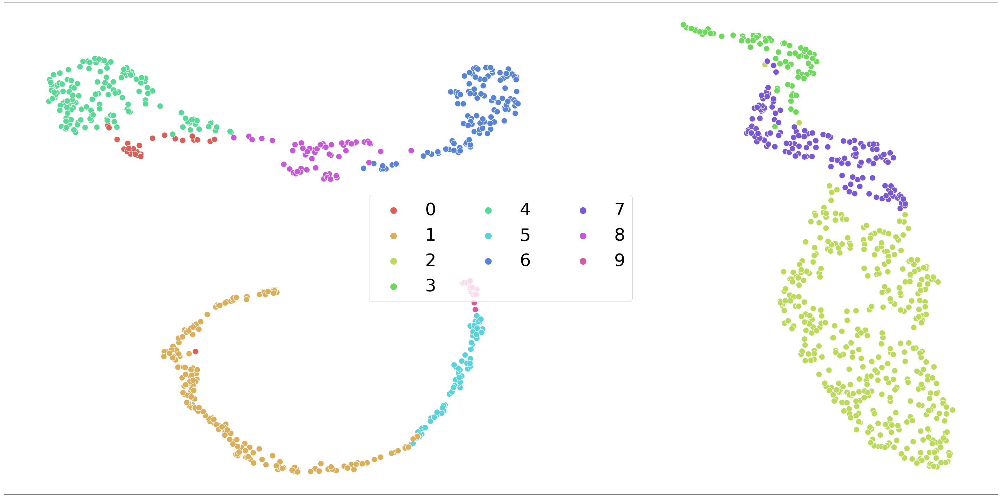

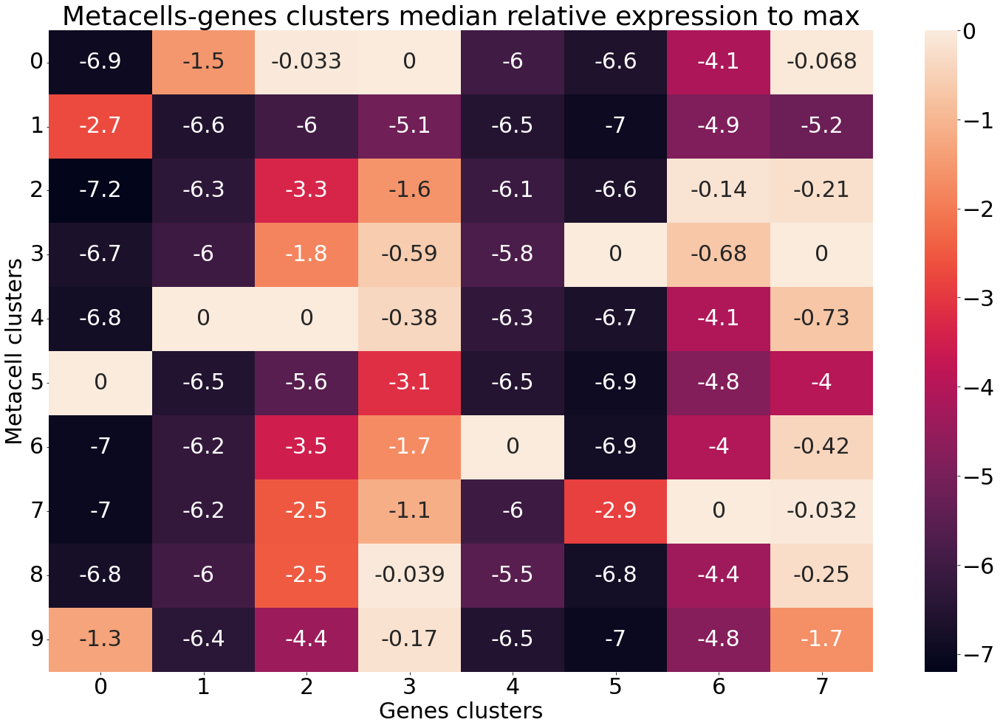

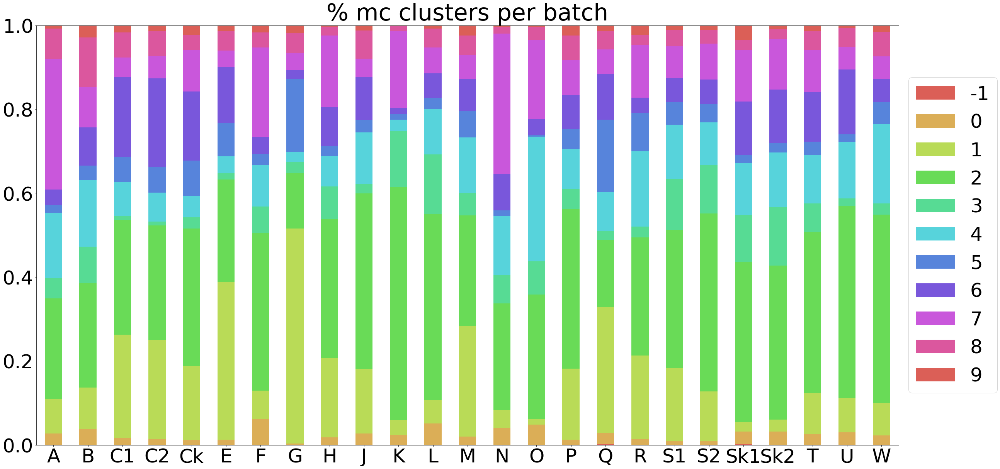

In [21]:
anf.plot_metacells_clustering_on_umap()
anf.plot_expression_diff_between_clusters(show_expression_value=True)
anf.plot_metacells_clusters_distribution_across_batches()

In [22]:
ane = AmbientNoiseEstimator(anf)
estimations_results = ane.estimate_noise_levels(max_relative_expression_for_metacells_genes_to_use = -4)

INFO - Starting to estimate noise levels per step
  0%|          | 0/10 [00:00<?, ?it/s]INFO - Step: 0, umi depth bin: 0 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step: 0, umi depth bin: 1 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step: 0, umi depth bin: 2 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step 0 didn't have enough equations to estimate noise, going to move to next step
INFO - Finish collecting information, solving equations for step 1
/net/mraid14/export/tgdata/users/drorba/ambient/new_analysis/../code_v3/RGlmSolver.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

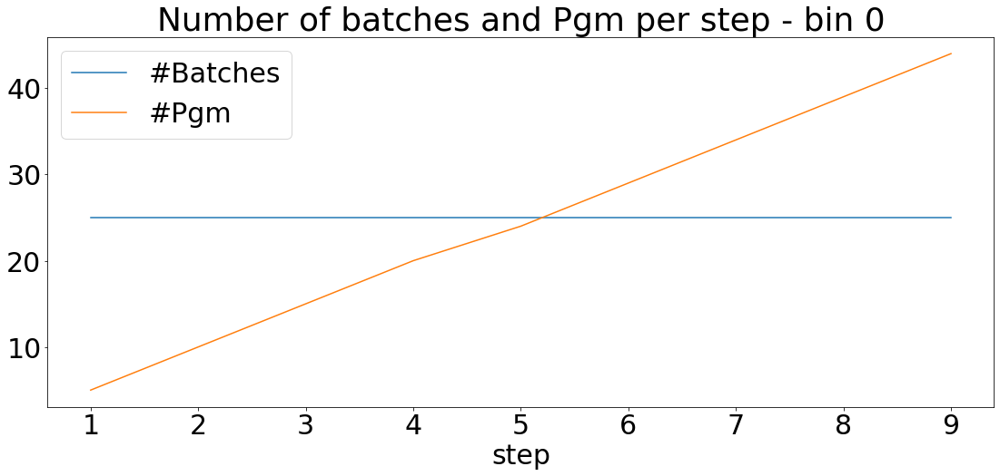

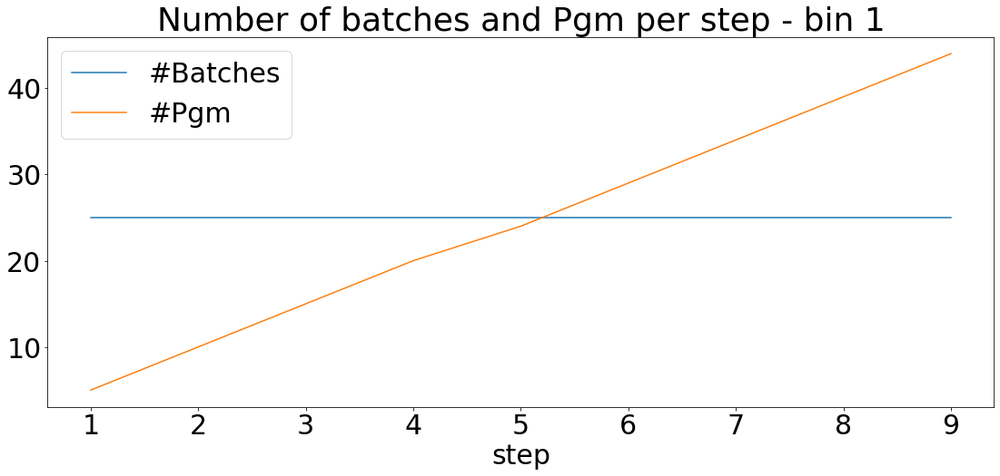

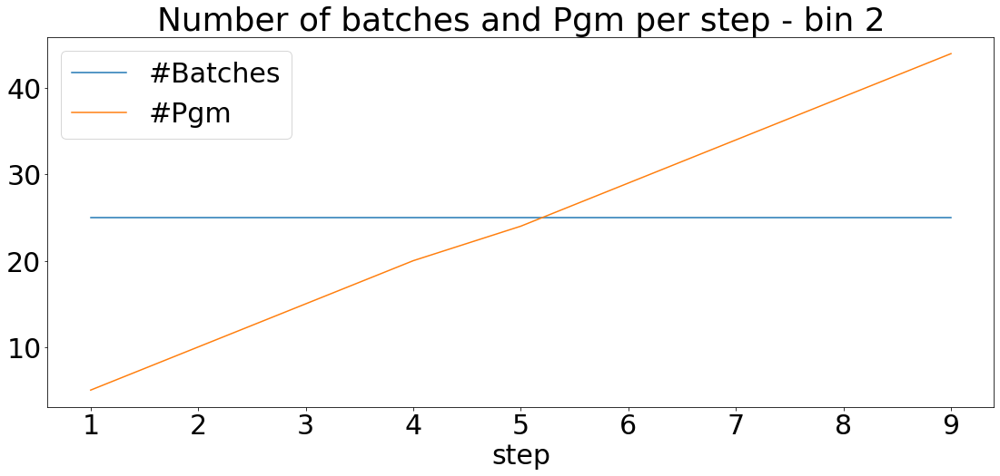

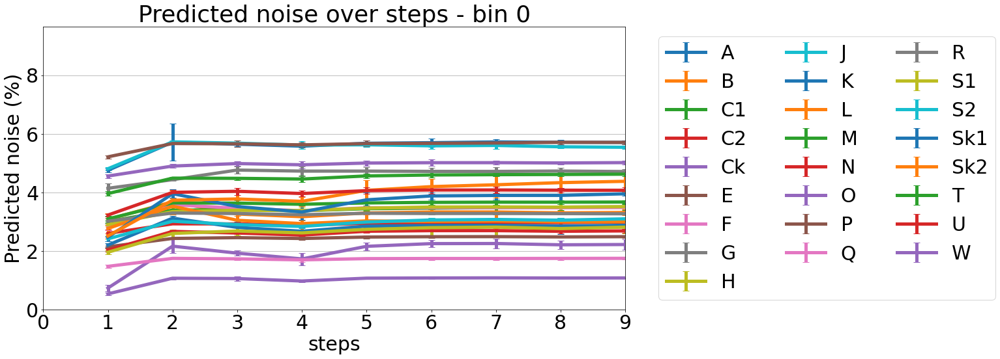

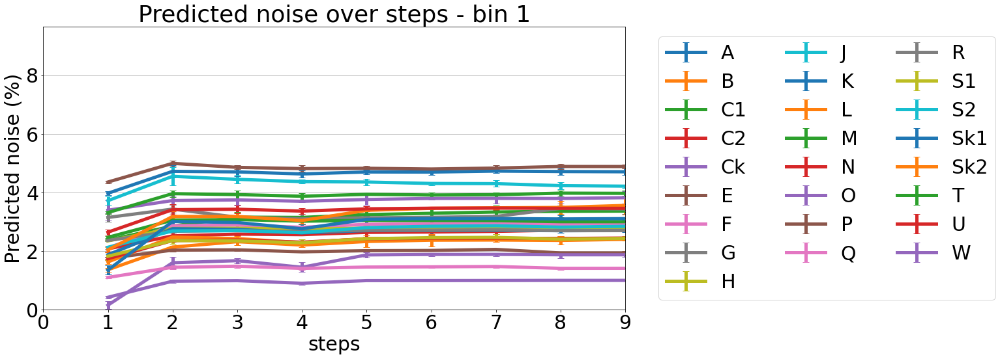

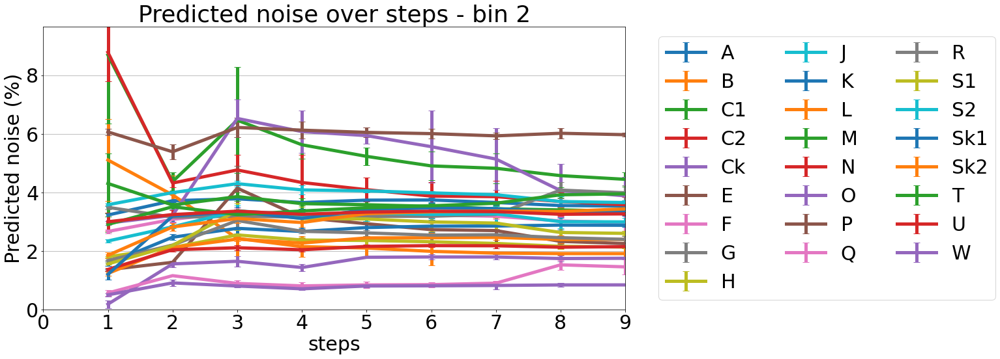

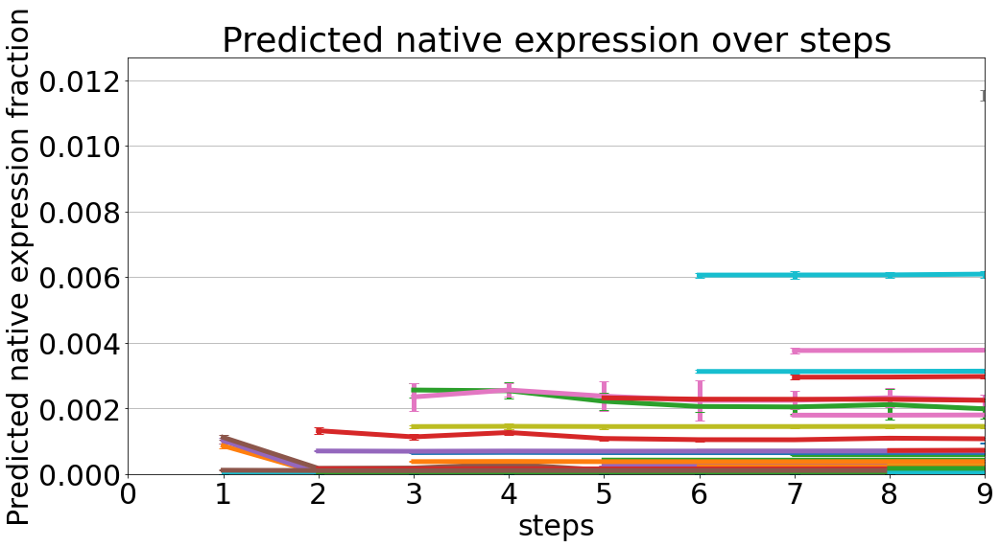

In [23]:
estimations_results.plot_number_of_batches_and_pgm_per_step()
estimations_results.plot_noise_level_estimation_per_step(show_batch_name=True)
estimations_results.plot_native_expression_estimation_per_step()

We will now choose a bit higher threshold due to the fact that the model stabalize only around step 6

In [29]:
step_to_use = 5

In [3]:
cells_with_noise_estimations_v2 = ane.get_cells_adata_with_noise_level_estimations(estimations_results, step_to_use)
cells_with_noise_estimations_v2.write_h5ad(os.path.join(output_path, "cells_with_noise_estimations_v2.h5ad"))

The next step is optional, <b>in case you skip</b> it you need to add the two next lines of code

In [ ]:
cells_with_noise_estimations_final = cells_with_noise_estimations_v2
cells_with_noise_estimations_final.write_h5ad(os.path.join(output_path, "cells_with_noise_estimations_final.h5ad"))

## Removing artifacts cells - optional

As written before, doublets and other artifacts in the data might shift the noise estimation a lot and in many cases we sould like to remove them.

This step is optional, if you see that the noise estimation is pretty constent thorught the different steps, or you have reasons to believe you already removed those artifacts before you can skip it.

- If you skipped this step then step 4.3 will be the last step of the pipeline: calculating the denoised metacells based on step 4.1 estimations.
- If you don't need this step, then you should run step 5


Taking our noise and Pgm estimations, we can now mark out cells which don't follow the mode of native expression and noise. Those cells are high candidates for doublets, outliers, or other artifacts in the data.

We will also mark metacells with high percentage (>50%) of those cells, and remove all cells inside those metacells.

In this example we perform this validation only for the Pgm of Erythrocytes due to the high levels of experssion it contribute, even when it is only noise. 

In [30]:
doublets_cells, doublet_percentage_in_metacells = ane.identify_doublets(estimations_results = estimations_results, 
                                                                        estimation_step = step_to_use,
                                                                        genes_clusters_for_doublet_finding = [anf.cells_adata.var.loc["HBB"].genes_cluster]
                                                                       )

dobulet_mc = doublet_percentage_in_metacells[doublet_percentage_in_metacells>=0.5].index
doublets_cells = list(set(doublets_cells + remix_cells_v1.obs.index[np.isin(remix_cells_v1.obs.metacell_name,dobulet_mc)].to_list()))
print("Found %s doublets cells and %s doublets metacells" %(len(doublets_cells), len(dobulet_mc)))

Found 7500 doublets cells and 16 doublets metacells


We can plot the percentage of 'bad' cells in metacell as a factor of specific genes and see that indeed a lot of those cells match what we would considered suspicious cells

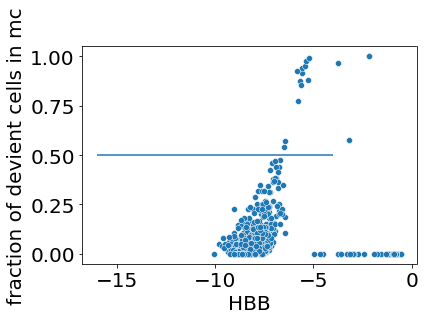

In [31]:
gene = "HBB"
sb.scatterplot(x=remixed_metacells_v1_lgc[gene].values, y=doublet_percentage_in_metacells.loc[remixed_metacells_v1_lgc.index])
plt.xlabel(gene)
plt.ylabel("fraction of devient cells in mc")
plt.hlines(y=0.5, xmin=-16, xmax=-4)

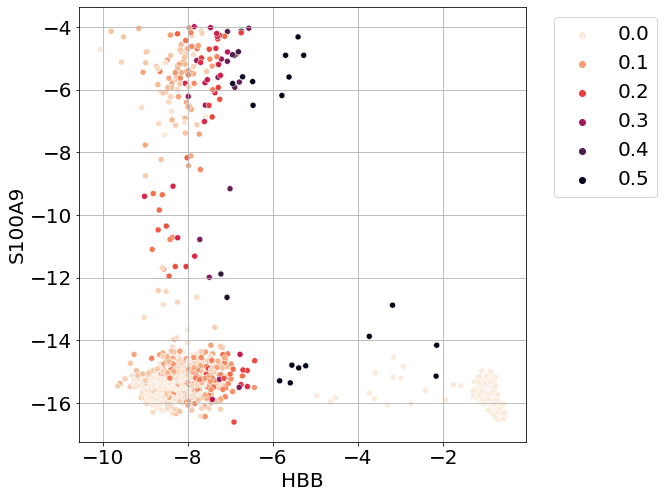

In [32]:
plt.rcParams.update({'font.size': 20})

plt.figure(figsize=(8,8))
sb.scatterplot(x=remixed_metacells_v1_lgc["HBB"],
               y=remixed_metacells_v1_lgc["S100A9"],
                hue=np.minimum(doublet_percentage_in_metacells.loc[remixed_metacells_v1_lgc.index],0.5),
                palette="rocket_r")
plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left", ncol=1)
plt.grid()

In [ ]:
not_doublets_cells = cells_with_noise_estimations_v2[~np.isin(cells_with_noise_estimations_v2.obs.index, doublets_cells)].obs.index
cells_with_noise_estimations_v2 = mc.ut.slice(cells_with_noise_estimations_v2, obs=not_doublets_cells)
cells_with_noise_estimations_v2.write_h5ad(os.path.join(output_path, "cells_with_noise_estimations_v2.h5ad"))

### Denoised metacells without artifacts

Now that we know those bad cells, we can remove them and re-create a metacell model with the estimation and without those cells which effected this estimation

In [34]:
denoised_cells_v2 = denoise_metacells_utils.generate_denoised_metacells(cells_with_noise_estimations_v2, 
                                                                           batch_empty_droplets)

mc.pl.divide_and_conquer_pipeline(denoised_cells_v2,random_seed=123456)
denoised_metacells_v2 = mc.pl.collect_metacells(denoised_cells_v2, random_seed=123456)
denoised_metacells_v2_lgc = np.log2(mc.ut.get_vo_frame(denoised_metacells_v2) + 1e-5)
mc.pl.compute_for_mcview(adata=denoised_cells_v2,gdata=denoised_metacells_v2, random_seed=123456)

INFO - Starting to deniose entire cell matrix
INFO - Starts to denoise batch: S1
INFO - Starts to denoise batch: J
INFO - Starts to denoise batch: T
INFO - Starts to denoise batch: G
INFO - Starts to denoise batch: M
INFO - Starts to denoise batch: Sk1
INFO - Starts to denoise batch: C1
INFO - Starts to denoise batch: S2
INFO - Starts to denoise batch: N
INFO - Starts to denoise batch: W
INFO - Starts to denoise batch: P
INFO - Starts to denoise batch: C2
INFO - Starts to denoise batch: Sk2
INFO - Starts to denoise batch: R
INFO - Starts to denoise batch: L
INFO - Starts to denoise batch: F
INFO - Starts to denoise batch: K
INFO - Starts to denoise batch: A
INFO - Starts to denoise batch: U
INFO - Starts to denoise batch: E
INFO - Finish denoising batch: Sk1
INFO - Starts to denoise batch: O
INFO - Finish denoising batch: R
INFO - Starts to denoise batch: Q
INFO - Finish denoising batch: G
INFO - Finish denoising batch: J
INFO - Finish denoising batch: S1
INFO - Starts to denoise batch

In [35]:
denoised_cells_v2.write_h5ad(os.path.join(output_path, "denoised_cells_v2.h5ad"))
denoised_metacells_v2.write_h5ad(os.path.join(output_path, "denoised_metacells_v2.h5ad"))

### Noise estimation without artifacts cells

As states before, the current noise estimation we had is based on those bad cells, which effected cell clustering, Pgm and noise levels estimations thorugh the equations.

We will want to do a final noise estimation, now with the correct assignment and without those bad cells. This should yield the final and most precise noise estimation, and using it we can actually get the clean metacell model we want

In [36]:
remix_cells_v2 = cells_with_noise_estimations_v2.copy()
mc.ut.set_o_data(remix_cells_v2, "metacell", denoised_cells_v2.obs.metacell)

In [37]:
remixed_metacells_v2 = mc.pl.collect_metacells(remix_cells_v2, random_seed=123456)
remixed_metacells_v2_lgc = np.log2(mc.ut.get_vo_frame(remixed_metacells_v2) + 1e-5)
mc.pl.compute_for_mcview(adata=remix_cells_v2,gdata=remixed_metacells_v2, random_seed=123456)

set metacells.obs[grouped]: 1142 int64s
set metacells.obs[total_umis]: 1142 float64s
set metacells.layers[total_umis]: ndarray 1142 X 28540 float32s
set metacells.obs[__zeros_downsample_umis]: 1142 int64s
set metacells.layers[zeros]: ndarray 1142 X 28540 int32s
set unnamed.obs[metacell_name]: 106745 <U8s
set metacells.var[bursty_lonely_gene]: 0 true (0%) out of 28540 bools
set metacells.var[properly_sampled_gene]: 28540 true (100%) out of 28540 bools
set metacells.var[excluded_gene]: 0 true (0%) out of 28540 bools
set metacells.var[full_gene_index]: 28540 int32s
set metacells.var[lateral_gene]: 4589 true (16.08%) out of 28540 bools
set metacells.var[selected_gene]: 2901 true (10.16%) out of 28540 bools
set metacells.var[rare_gene]: 6 true (0.02102%) out of 28540 bools
set metacells.var[rare_gene_module]: 28540 int32s
set metacells.var[genes_cluster]: 28540 int64s
set metacells.obs[metacells_rare_gene_module]: 1142 int32s
set metacells.obs[rare_metacell]: 1 true (0.08757%) out of 1142 b

In [38]:
anf = AmbientNoiseFinder(cells_adata=remix_cells_v2, 
                         metacells_adata=remixed_metacells_v2, 
                         batches_empty_droplets_dict=batch_empty_droplets,
                         extract_batch_names_function=extract_batch_names_function, 
                         expression_delta_for_candidates_genes=5, 
                         number_of_genes_clusters=8, 
                        )

INFO - Working on 25 batches
INFO - No gene clusters provided, will create 8 clusters, only_use_features_genes: False, use_lateral_genes:False
INFO - No metacell clusters provided, will create 10 clusters
INFO - Ready to estimate noise levels


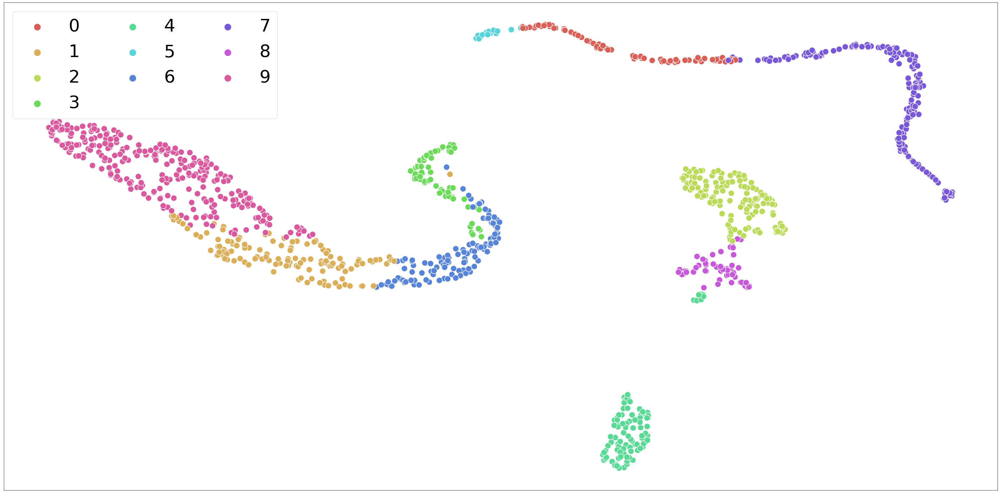

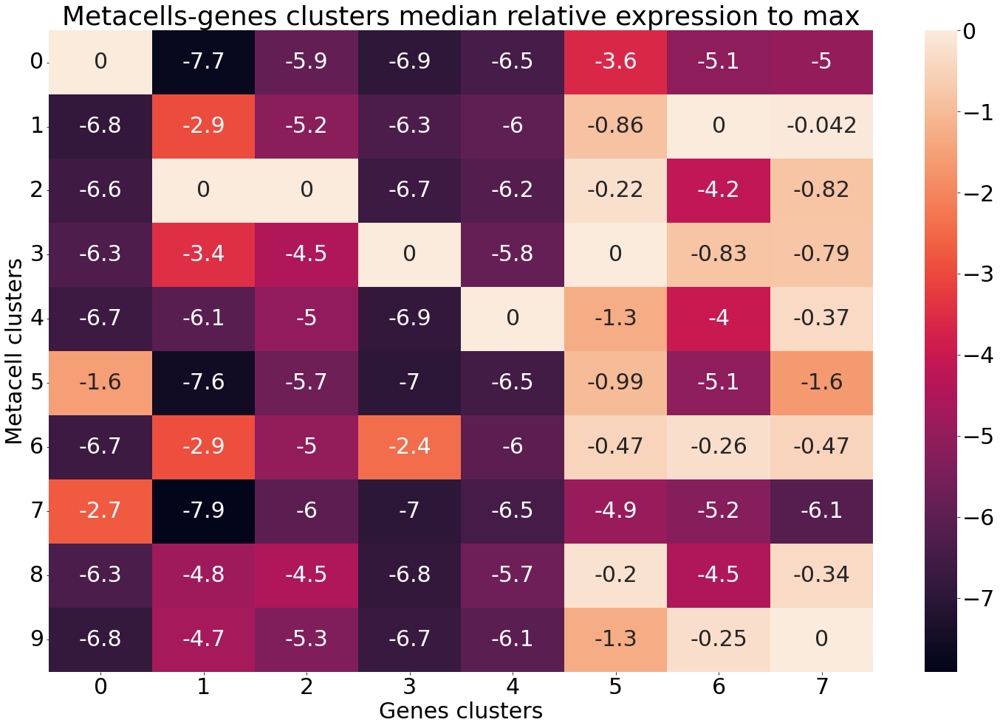

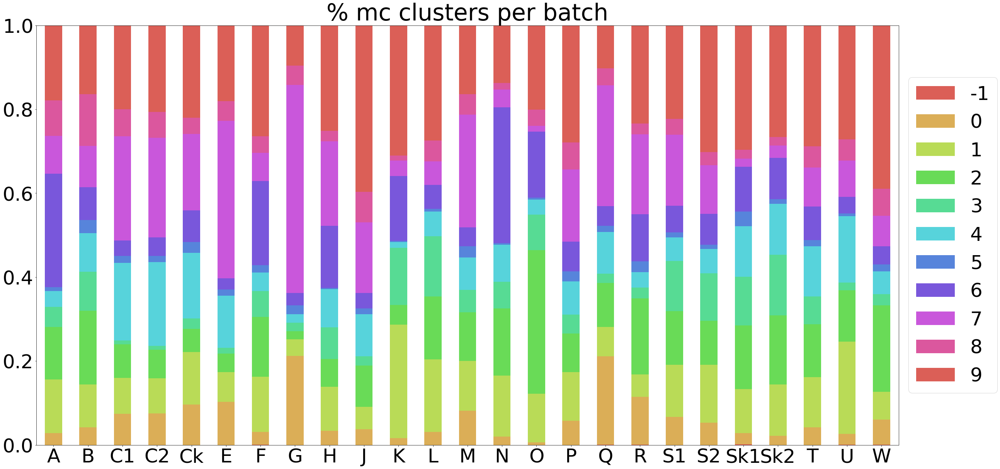

In [39]:
anf.plot_metacells_clustering_on_umap()
anf.plot_expression_diff_between_clusters(show_expression_value=True)
anf.plot_metacells_clusters_distribution_across_batches()
# anf.plot_umis_depth_bins_distribution_across_batches()

In [40]:
ane = AmbientNoiseEstimator(anf)
estimations_results = ane.estimate_noise_levels(max_relative_expression_for_metacells_genes_to_use = -4)

INFO - Starting to estimate noise levels per step
  0%|          | 0/10 [00:00<?, ?it/s]INFO - Step: 0, umi depth bin: 0 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step: 0, umi depth bin: 1 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step: 0, umi depth bin: 2 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step 0 didn't have enough equations to estimate noise, going to move to next step
 10%|█         | 1/10 [00:00<00:00,  9.89it/s]INFO - Finish collecting information, solving equations for step 1
/net/mraid14/export/tgdata/users/drorba/ambient/new_analysis/../code_v3/RGlmSolver.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

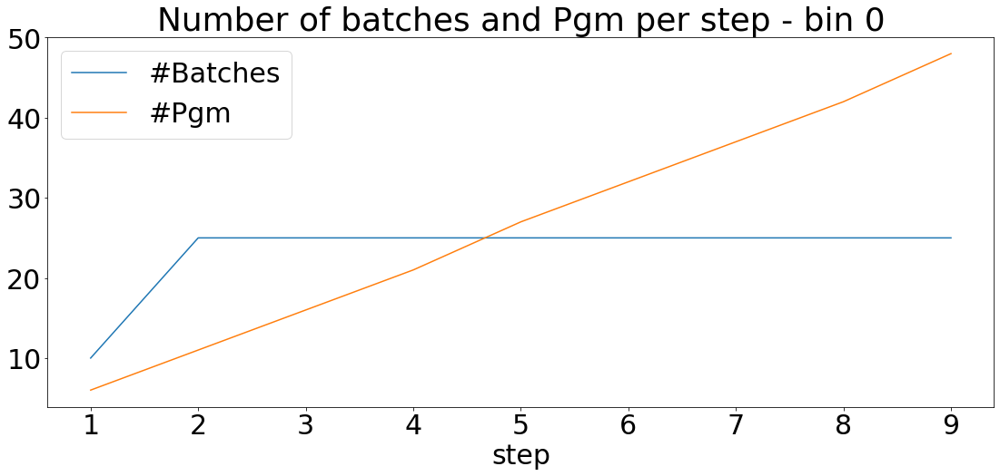

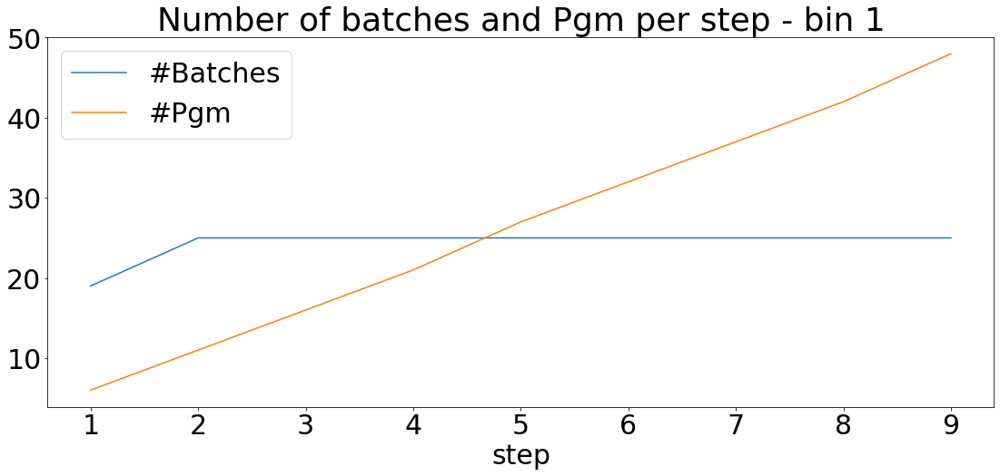

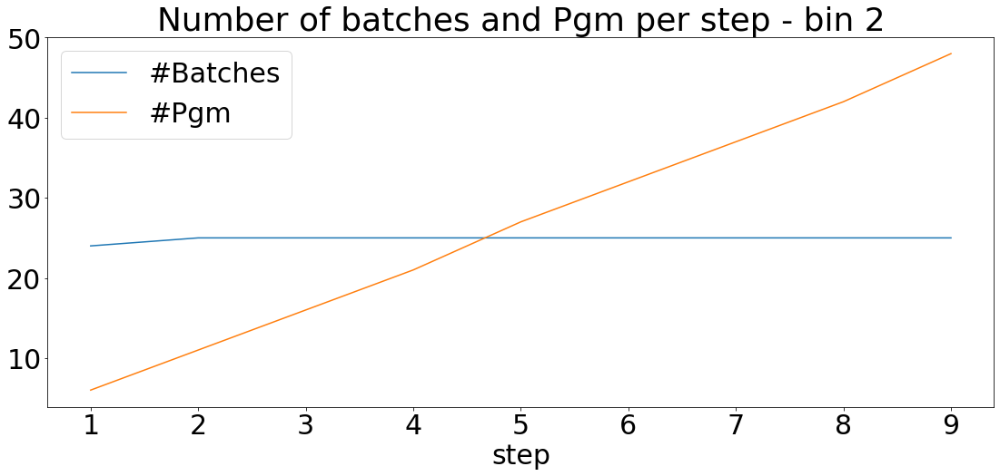

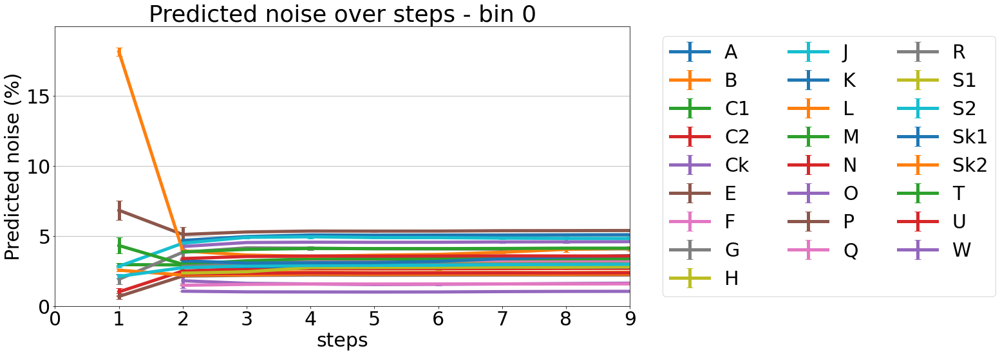

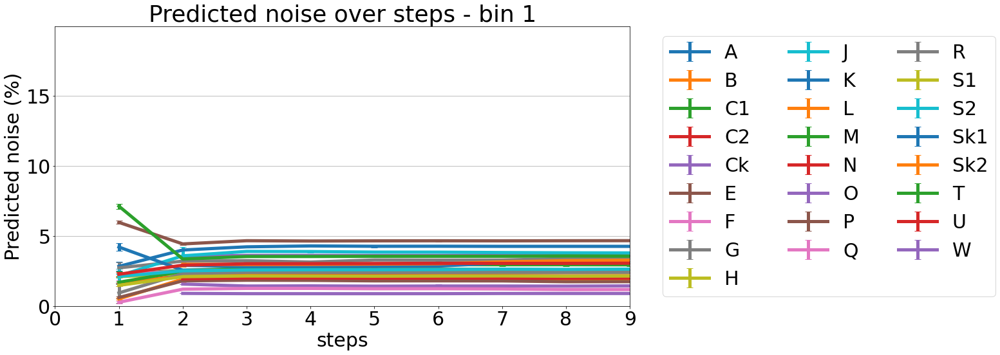

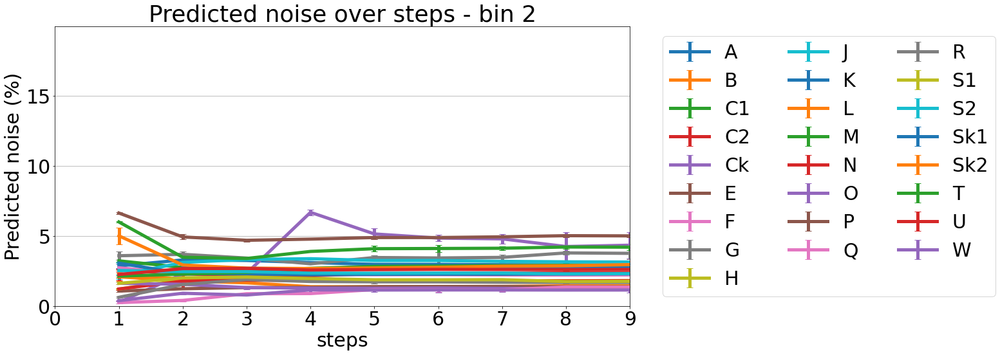

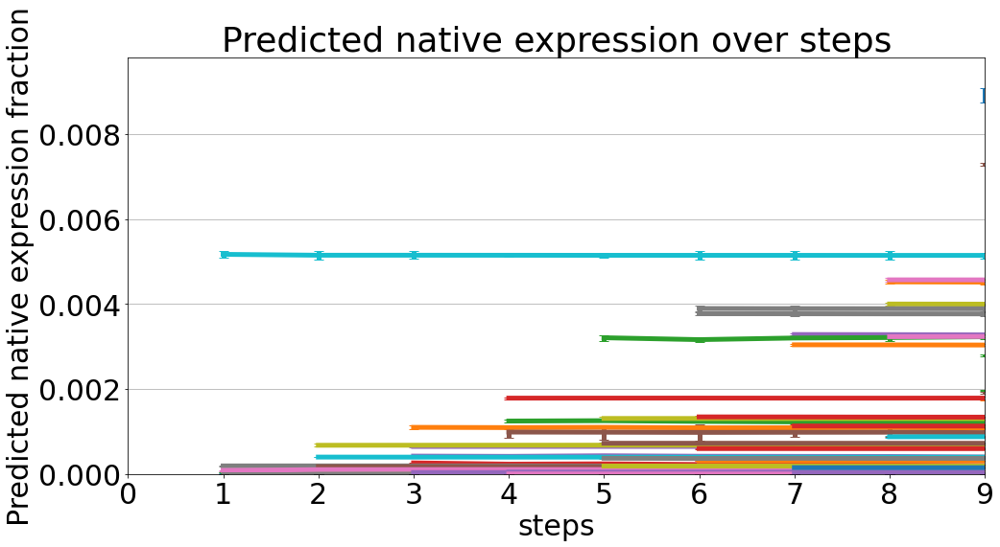

In [41]:
estimations_results.plot_number_of_batches_and_pgm_per_step()
estimations_results.plot_noise_level_estimation_per_step(show_batch_name=True)
estimations_results.plot_native_expression_estimation_per_step()

We will now choose the final threshold and show the estimated prediction for each batch

In [50]:
step_to_use = 6

# Noise estimation QC

In [46]:
estimations_results.noise_levels_estimations[step_to_use]

,predicted,predicted_sd,predicted_percentages,predicted_sd_percentages,umi_depth_bin
A,0.050547,0.000320,5.054740,0.032025,0
B,0.023833,0.000360,2.383302,0.035955,0
C1,0.031121,0.000207,3.112126,0.020721,0
C2,0.026531,0.000263,2.653093,0.026331,0
Ck,0.045451,0.000526,4.545122,0.052593,0
...,...,...,...,...,...
Sk1,0.026192,0.000381,2.619250,0.038135,2
Sk2,0.027153,0.000269,2.715325,0.026909,2
T,0.040889,0.001948,4.088924,0.194765,2
U,0.025961,0.000505,2.596068,0.050537,2


We can also look at the relation between the estimation in differnet bins and the total r^2 and likelihood of our estimation to get a feeling about how precise it is

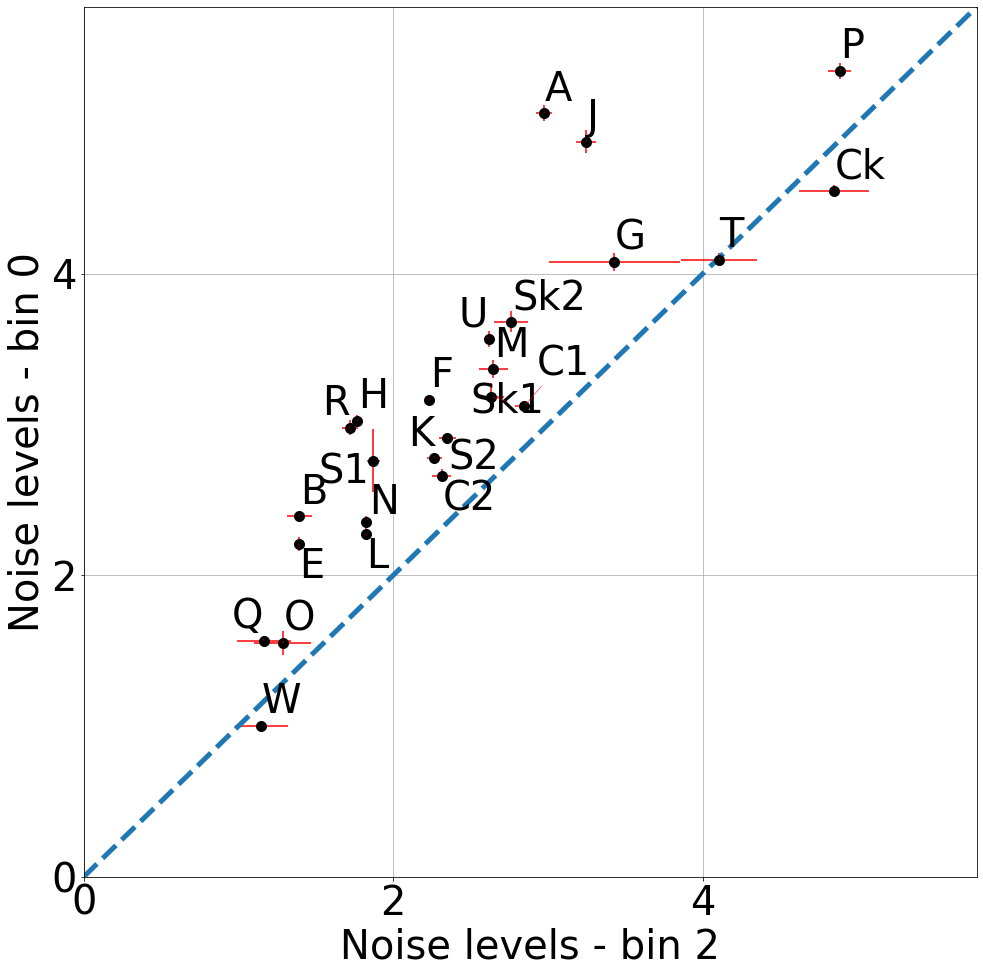

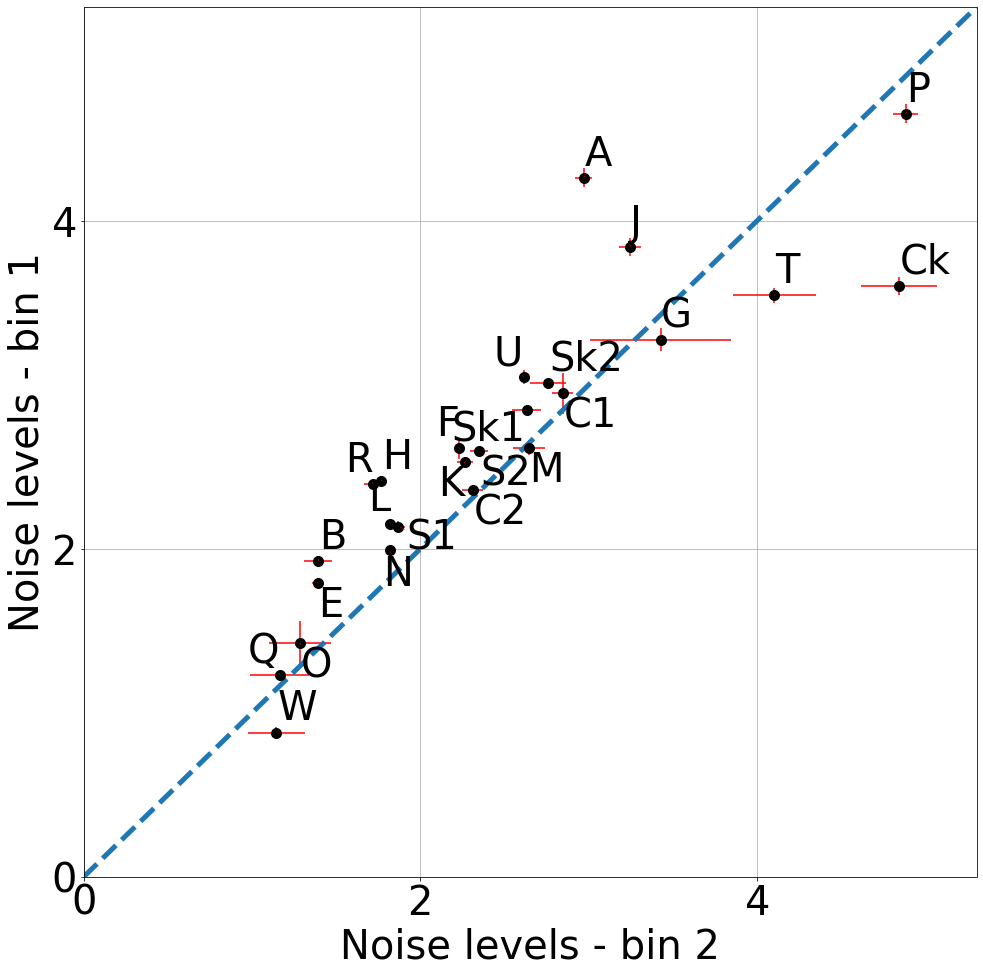

/net/mraid14/export/tgdata/users/drorba/ambient/new_analysis/../code_v3/EstimationResults.py:742: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.yscale("log", basey=2)
/net/mraid14/export/tgdata/users/drorba/ambient/new_analysis/../code_v3/EstimationResults.py:743: MatplotlibDeprecationWarning: The 'basex' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.xscale("log", basex=2)


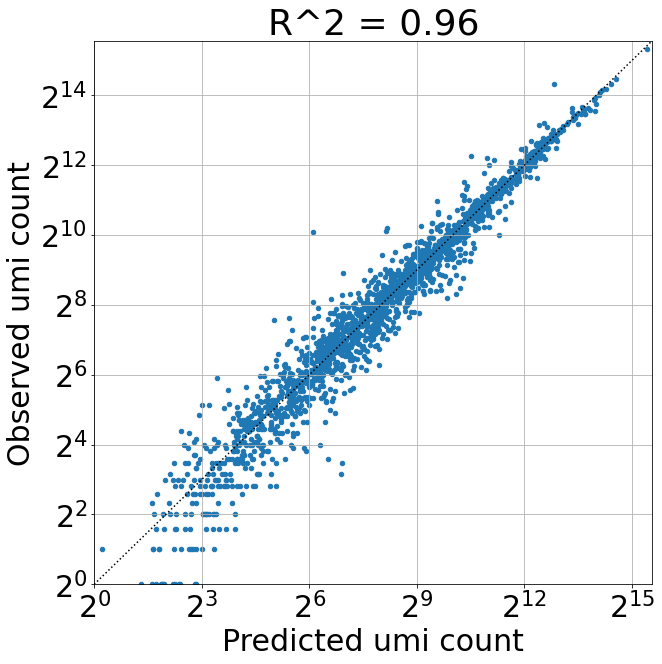

/net/mraid14/export/tgdata/users/drorba/ambient/new_analysis/../code_v3/EstimationResults.py:860: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  ax.set_yscale("log", basey=2)


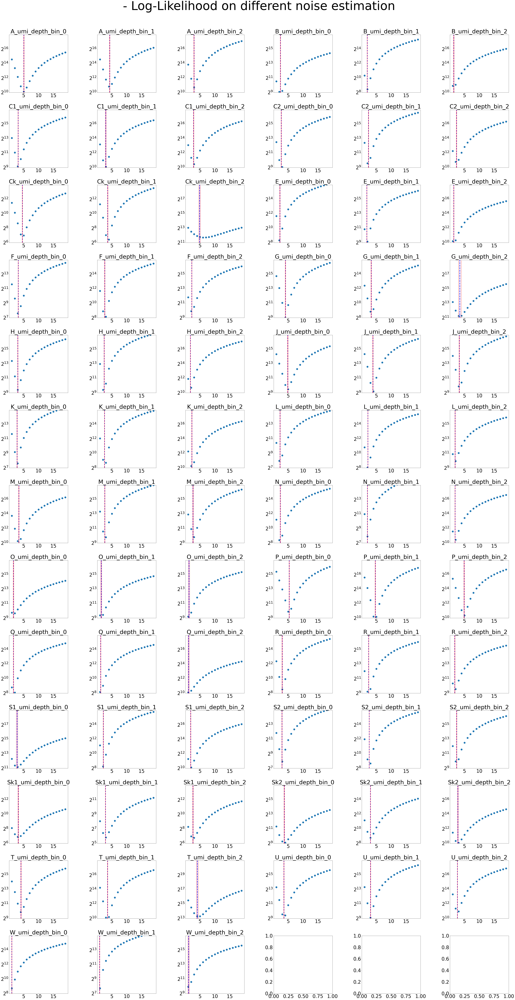

In [44]:
estimations_results.plot_noise_estimation_difference_between_umi_depth_bins(step=step_to_use,umi_depth_bin_1=2,umi_depth_bin_2=0)
estimations_results.plot_noise_estimation_difference_between_umi_depth_bins(step=step_to_use,umi_depth_bin_1=2,umi_depth_bin_2=1)

r2_score = estimations_results.plot_observed_vs_predicted_umis(step=step_to_use)
estimations_results.plot_log_likelihood_of_estimation(step=step_to_use)

/net/mraid14/export/tgdata/users/drorba/ambient/new_analysis/../code_v3/EstimationResults.py:860: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  ax.set_yscale("log", basey=2)


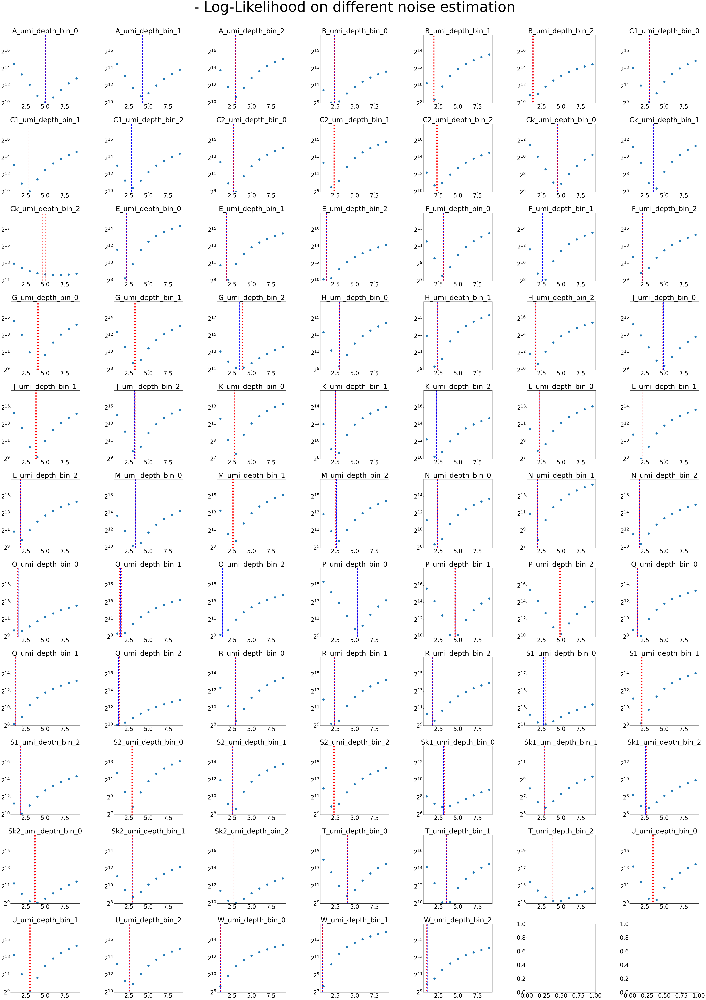

In [51]:
estimations_results.plot_log_likelihood_of_estimation(step=step_to_use, max_noise_estimation=0.1, n_cols=7)

We will save the results, and re-create the clean version of the metacells

In [52]:
with open(os.path.join(output_path, "estimation_results_final.pkl"), "wb") as f:
    pickle.dump(estimations_results, f)

In [53]:
cells_with_noise_estimations_final = ane.get_cells_adata_with_noise_level_estimations(estimations_results, step_to_use)
cells_with_noise_estimations_final.write_h5ad(os.path.join(output_path, "cells_with_noise_estimations_final.h5ad"))

# Generating clean metacell model

In [54]:
denoised_cells_ad_final = denoise_metacells_utils.generate_denoised_metacells(cells_with_noise_estimations_final, batch_empty_droplets)

mc.pl.divide_and_conquer_pipeline(denoised_cells_ad_final,random_seed=123456)

metacells_ad_remix_denoised_final = mc.pl.collect_metacells(denoised_cells_ad_final, random_seed=123456)
metacells_ad_remix_denoised_final_lgc = np.log2(mc.ut.get_vo_frame(metacells_ad_remix_denoised_final) + 1e-5)
mc.pl.compute_for_mcview(adata=denoised_cells_ad_final,gdata=metacells_ad_remix_denoised_final_lgc, random_seed=123456)

INFO - Starting to deniose entire cell matrix
INFO - Starts to denoise batch: S1
INFO - Starts to denoise batch: J
INFO - Starts to denoise batch: T
INFO - Starts to denoise batch: G
INFO - Starts to denoise batch: M
INFO - Starts to denoise batch: Sk1
INFO - Starts to denoise batch: C1
INFO - Starts to denoise batch: S2
INFO - Starts to denoise batch: W
INFO - Starts to denoise batch: N
INFO - Starts to denoise batch: P
INFO - Starts to denoise batch: C2
INFO - Starts to denoise batch: Sk2
INFO - Starts to denoise batch: R
INFO - Starts to denoise batch: L
INFO - Starts to denoise batch: F
INFO - Starts to denoise batch: A
INFO - Starts to denoise batch: K
INFO - Starts to denoise batch: U
INFO - Starts to denoise batch: E
INFO - Finish denoising batch: Sk1
INFO - Starts to denoise batch: O
INFO - Finish denoising batch: R
INFO - Starts to denoise batch: Q
INFO - Finish denoising batch: W
INFO - Starts to denoise batch: Ck
INFO - Finish denoising batch: G
INFO - Starts to denoise batc

In [55]:
denoised_cells_ad_final.write_h5ad(os.path.join(output_path, "denoised_cells_final.h5ad"))
metacells_ad_remix_denoised_final.write_h5ad(os.path.join(output_path, "denoised_metacells_final.h5ad"))